# Network Centrality

## Importazione del dataset

In [98]:
import igraph as ig
import numpy as np
import random
import pandas as pd
import csv
import matplotlib.pyplot as plt
import seaborn as sns
random.seed(0)

In [99]:
csv_file_path = '../reddit_comments.csv'
df = pd.read_csv(csv_file_path)
print(df.shape)

(3763, 13)


In [100]:
df

,comment_id,comment_author_id,comment_author_name,comment_parent_id,comment_parent_name,comment_score,comment_replies,comment_posted_time,comment_body,post_id,post_title,post_url,post_subreddit
0,k9yfohd,209w6fpg,moonwave91,0,OP,160,2,1.700439e+09,Il vero problema è l'immensa orda di giornalis...,17z2hci,Ho visto troppi post sulla Giulia Cecchettin,https://www.reddit.com/r/Italia/comments/17z2h...,t5_2rbm5
1,k9xjbzd,deleted,deleted,0,OP,310,3,1.700426e+09,"Non è un idiota l'ex ragazzo, è un assassino, ...",17z2hci,Ho visto troppi post sulla Giulia Cecchettin,https://www.reddit.com/r/Italia/comments/17z2h...,t5_2rbm5
2,k9zies2,e5pmjzs5c,MainDelay9804,0,OP,22,0,1.700459e+09,Sono sti ragazzetti sui social che ormai han p...,17z2hci,Ho visto troppi post sulla Giulia Cecchettin,https://www.reddit.com/r/Italia/comments/17z2h...,t5_2rbm5
3,k9xb0xr,utwr8mto,AlessandroIT,0,OP,83,1,1.700422e+09,"Non fatevi influenzare dai post, continuate ad...",17z2hci,Ho visto troppi post sulla Giulia Cecchettin,https://www.reddit.com/r/Italia/comments/17z2h...,t5_2rbm5
4,k9xmjhd,49phg2z0,CthulhuParty,0,OP,87,1,1.700427e+09,ti da fastidio perchè percepisci giustamente c...,17z2hci,Ho visto troppi post sulla Giulia Cecchettin,https://www.reddit.com/r/Italia/comments/17z2h...,t5_2rbm5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3758,l6oapir,vin55xk0,bister_is_here,fclpv,_samux_,1,0,1.717274e+09,Scusami non sto capendo.\n\n\nPremesso che ero...,1d5h5h6,"Boom di giovani in fuga dall’Italia, sono oltr...",https://quifinanza.it/economia/giovani-italian...,t5_2rbm5
3759,l6moubs,b1qcxw27,SimpatiaPazza,5sub6wtou,chris90italy,1,1,1.717252e+09,Ma cosa devo argomentare? Ti ho chiesto perché...,1d5h5h6,"Boom di giovani in fuga dall’Italia, sono oltr...",https://quifinanza.it/economia/giovani-italian...,t5_2rbm5
3760,l6moxgi,b1qcxw27,SimpatiaPazza,5sub6wtou,chris90italy,1,1,1.717252e+09,Italia paese di frustrati: ecco l'esempio vivente,1d5h5h6,"Boom di giovani in fuga dall’Italia, sono oltr...",https://quifinanza.it/economia/giovani-italian...,t5_2rbm5
3761,l6mq6kl,5sub6wtou,chris90italy,b1qcxw27,SimpatiaPazza,1,0,1.717253e+09,La cultura è l'esatto opposto di come ti compo...,1d5h5h6,"Boom di giovani in fuga dall’Italia, sono oltr...",https://quifinanza.it/economia/giovani-italian...,t5_2rbm5


### Selezione di un singolo post

In [101]:
df['post_url'].value_counts()

post_url
https://i.redd.it/ik2o0xruwbmc1.jpeg                                                               625
https://i.redd.it/aivawxoi2lga1.jpg                                                                587
https://www.reddit.com/r/Italia/comments/17z2hci/ho_visto_troppi_post_sulla_giulia_cecchettin/     574
https://quifinanza.it/economia/giovani-italiani-estero-dati-2024/823439/                           517
https://www.reddit.com/r/Italia/comments/1cwqkqe/chi_voterete_alle_europee/                        434
https://www.reddit.com/r/Italia/comments/1bulhj9/il_problema_del_caldo_anomalocausato_dal/         425
https://www.reddit.com/r/Italia/comments/17lese9/4000_bambini_morti_in_palestina_possibile_che/    372
https://i.redd.it/vrb8l4slsqcc1.jpeg                                                               229
Name: count, dtype: int64

## Analisi sul primo post

https://www.reddit.com/r/Italia/comments/17z2hci/ho_visto_troppi_post_sulla_giulia_cecchettin/

Nel seguente grafo (relativo al primo post) i nodi sono le persone che hanno commentato sotto al post:

In [102]:
# Filtro i commenti relativi al primo post nel dataframe
post_id = df['post_id'].iloc[0]
post_comments = df[df['post_id'] == post_id]

In [103]:
df.columns

Index(['comment_id', 'comment_author_id', 'comment_author_name',
       'comment_parent_id', 'comment_parent_name', 'comment_score',
       'comment_replies', 'comment_posted_time', 'comment_body', 'post_id',
       'post_title', 'post_url', 'post_subreddit'],
      dtype='object')

In [104]:
# Rimuovo i prefissi dagli ID dei commenti genitori
post_comments['comment_parent_id'] = post_comments['comment_parent_id'].str.replace(r'^t\d_', '', regex=True)

C:\Users\franc\AppData\Local\Temp\ipykernel_18928\4115249832.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  post_comments['comment_parent_id'] = post_comments['comment_parent_id'].str.replace(r'^t\d_', '', regex=True)


In [105]:
post_comments

,comment_id,comment_author_id,comment_author_name,comment_parent_id,comment_parent_name,comment_score,comment_replies,comment_posted_time,comment_body,post_id,post_title,post_url,post_subreddit
0,k9yfohd,209w6fpg,moonwave91,0,OP,160,2,1.700439e+09,Il vero problema è l'immensa orda di giornalis...,17z2hci,Ho visto troppi post sulla Giulia Cecchettin,https://www.reddit.com/r/Italia/comments/17z2h...,t5_2rbm5
1,k9xjbzd,deleted,deleted,0,OP,310,3,1.700426e+09,"Non è un idiota l'ex ragazzo, è un assassino, ...",17z2hci,Ho visto troppi post sulla Giulia Cecchettin,https://www.reddit.com/r/Italia/comments/17z2h...,t5_2rbm5
2,k9zies2,e5pmjzs5c,MainDelay9804,0,OP,22,0,1.700459e+09,Sono sti ragazzetti sui social che ormai han p...,17z2hci,Ho visto troppi post sulla Giulia Cecchettin,https://www.reddit.com/r/Italia/comments/17z2h...,t5_2rbm5
3,k9xb0xr,utwr8mto,AlessandroIT,0,OP,83,1,1.700422e+09,"Non fatevi influenzare dai post, continuate ad...",17z2hci,Ho visto troppi post sulla Giulia Cecchettin,https://www.reddit.com/r/Italia/comments/17z2h...,t5_2rbm5
4,k9xmjhd,49phg2z0,CthulhuParty,0,OP,87,1,1.700427e+09,ti da fastidio perchè percepisci giustamente c...,17z2hci,Ho visto troppi post sulla Giulia Cecchettin,https://www.reddit.com/r/Italia/comments/17z2h...,t5_2rbm5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
569,k9y62fj,deleted,deleted,1rz25eig,Sir_elle,1,0,1.700435e+09,Lol ma guarda che non ho detto di essere io la...,17z2hci,Ho visto troppi post sulla Giulia Cecchettin,https://www.reddit.com/r/Italia/comments/17z2h...,t5_2rbm5
570,ka031nw,mwtgrnt,krell46,deleted,deleted,2,0,1.700477e+09,"Io non ho letto istigazioni all’odio, ho letto...",17z2hci,Ho visto troppi post sulla Giulia Cecchettin,https://www.reddit.com/r/Italia/comments/17z2h...,t5_2rbm5
571,k9zqygu,tsm4b,plitaway,krzdjmj,TengenToppa999,1,0,1.700466e+09,"Ma che insulto, sempre a fare le vittime state...",17z2hci,Ho visto troppi post sulla Giulia Cecchettin,https://www.reddit.com/r/Italia/comments/17z2h...,t5_2rbm5
572,k9yh8wj,1rz25eig,Sir_elle,deleted,deleted,3,0,1.700440e+09,Non c e nulla da comprendere sei te che non ha...,17z2hci,Ho visto troppi post sulla Giulia Cecchettin,https://www.reddit.com/r/Italia/comments/17z2h...,t5_2rbm5


In [106]:
# Mi assicuro che i dati siano del tipo corretto (stringhe per ID)
post_comments['comment_id'] = post_comments['comment_id'].astype(str)
post_comments['comment_parent_id'] = post_comments['comment_parent_id'].astype(str)

C:\Users\franc\AppData\Local\Temp\ipykernel_18928\2244879157.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  post_comments['comment_id'] = post_comments['comment_id'].astype(str)
C:\Users\franc\AppData\Local\Temp\ipykernel_18928\2244879157.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  post_comments['comment_parent_id'] = post_comments['comment_parent_id'].astype(str)


### Creazione dei nodi del grafo

In [107]:
# Creazione dei nodi (autori dei commenti)
comment_authors = post_comments['comment_author_name'].unique()

In [108]:
# Creo un grafo vuoto
g = ig.Graph(directed=True)

# Aggiungo i nodi al grafo (gli autori dei commenti)
g.add_vertices(comment_authors)

In [109]:
# Lista per gli archi (con sorgente, destinazione e peso)
edges = []

In [110]:
for _, comment in post_comments.iterrows():
    #print(_)
    print(comment)

comment_id                                                       k9yfohd
comment_author_id                                               209w6fpg
comment_author_name                                           moonwave91
comment_parent_id                                                      0
comment_parent_name                                                   OP
comment_score                                                        160
comment_replies                                                        2
comment_posted_time                                         1700439355.0
comment_body           Il vero problema è l'immensa orda di giornalis...
post_id                                                          17z2hci
post_title                  Ho visto troppi post sulla Giulia Cecchettin
post_url               https://www.reddit.com/r/Italia/comments/17z2h...
post_subreddit                                                  t5_2rbm5
Name: 0, dtype: object
comment_id                  

### Creazione degli archi del grafo

Controllo se il nodo è top level oppure no e creo tutti gli archi del mio grafo:

In [111]:
for _, comment in post_comments.iterrows():
    if (comment['comment_parent_id'] != '0' and comment['comment_parent_name'] != 'deleted'):
        source = comment['comment_parent_name']
        target = comment['comment_author_name']
        weight = comment['comment_score']  # Uso lo score del commento come peso dell'arco
        edges.append((source, target, weight))

In [112]:
edges

[('moonwave91', 'Scarsocontesto', 30),
 ('moonwave91', 'rossi46go', 16),
 ('AlessandroIT', 'DERPESSION', 19),
 ('CthulhuParty', 'professional_oxy', 22),
 ('lorefighter', 'frds3', 9),
 ('QuelTizioLaggiu', 'AostaValley', 8),
 ('QuelTizioLaggiu', 'LadyMacSantis', 3),
 ('emmagol', 'WillyMckenna', 47),
 ('emmagol', 'Hiro34', 18),
 ('emmagol', 'deleted', -3),
 ('emmagol', 'headlessfreak1592', 0),
 ('emmagol', '44252381471', -7),
 ('sBrrtou97', 'bbossolo', 9),
 ('sBrrtou97', 'South_Creme181', -4),
 ('Astroruggie', 'Strider2126', 49),
 ('Astroruggie', 'Sir_elle', 39),
 ('Astroruggie', 'sfwthrowaway96', 49),
 ('Astroruggie', 'AostaValley', 25),
 ('Astroruggie', 'Dakem94', 22),
 ('Astroruggie', 'Frank_Cy', 21),
 ('Astroruggie', 'LadyMacSantis', 7),
 ('Astroruggie', 'wombawumpa', 3),
 ('Astroruggie', 'fantasmeeno', 7),
 ('Astroruggie', 'headlessfreak1592', 0),
 ('Astroruggie', 'deleted', -16),
 ('Sir_elle', 'Desperate-Pea-2091', 2),
 ('1_dont_care', 'Pop0_LoW', 2),
 ('1_dont_care', '16F628A', 2),

In [113]:
# Aggiungi gli archi al grafo con peso
g.add_edges([(source, target) for source, target, _ in edges])

# Aggiungi i pesi agli archi
g.es['weight'] = [weight for _, _, weight in edges]

In [114]:
# Stampo il sommario del grafo
g.summary()
print(g)

IGRAPH DNW- 205 358 --
+ attr: name (v), weight (e)
+ edges (vertex names):
moonwave91->Scarsocontesto, moonwave91->rossi46go, AlessandroIT->DERPESSION,
CthulhuParty->professional_oxy, lorefighter->frds3,
QuelTizioLaggiu->AostaValley, QuelTizioLaggiu->LadyMacSantis,
emmagol->WillyMckenna, emmagol->Hiro34, emmagol->deleted,
emmagol->headlessfreak1592, emmagol->44252381471, sBrrtou97->bbossolo,
sBrrtou97->South_Creme181, Astroruggie->Strider2126, Astroruggie->Sir_elle,
Astroruggie->sfwthrowaway96, Astroruggie->AostaValley, Astroruggie->Dakem94,
Astroruggie->Frank_Cy, Astroruggie->LadyMacSantis, Astroruggie->wombawumpa,
Astroruggie->fantasmeeno, Astroruggie->headlessfreak1592,
Astroruggie->deleted, Sir_elle->Desperate-Pea-2091, 1_dont_care->Pop0_LoW,
1_dont_care->16F628A, squadraRMN->btlop, squadraRMN->allegrigri,
squadraRMN->South_Creme181, squadraRMN->Clank_8-7, squadraRMN->deleted,
squadraRMN->deleted, varrr->RiccardoForni, Zealousideal_Humor55->Alxssandro,
Zealousideal_Humor55->Pop0_L

In [115]:
# Visualizzazione del grafo con frecce e spessore degli archi basato sul peso
def plot_graph(g):
    
    ig.plot(
        g, 
        vertex_size=20, 
        edge_arrow_size=0.5,    
        edge_width=[0.5 + 2 * weight / max(g.es['weight']) for weight in g.es['weight']],  # Spessore degli archi basato sul peso
        margin=50,
        vertex_label_dist= 2,
        bbox=(800, 800),
    )

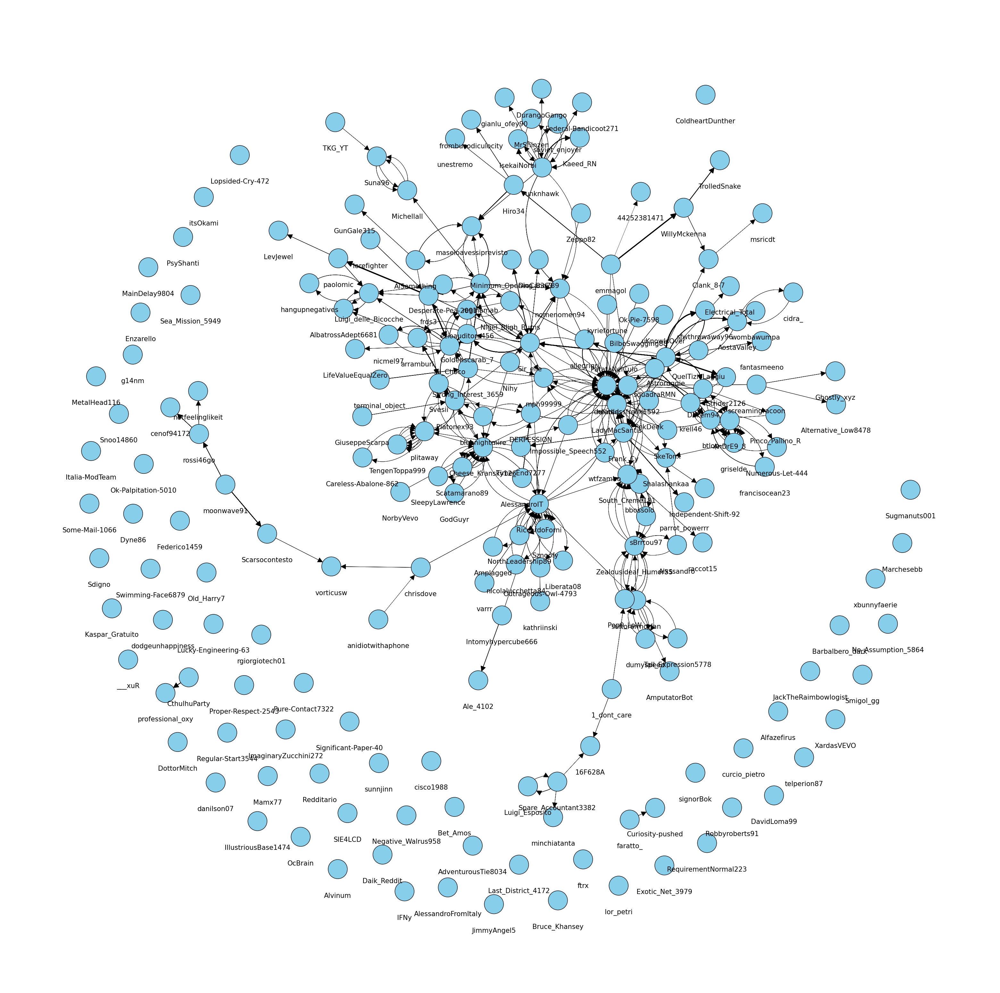

In [130]:
import matplotlib.pyplot as plt  # Importa Matplotlib per la visualizzazione grafica
import igraph as ig  # Importa iGraph per la manipolazione dei grafi

# Funzione per visualizzare il grafo
def plot_graph(g):
    # Utilizza il layout Fruchterman-Reingold
    layout = g.layout_fruchterman_reingold()
    # Scala il layout per aumentare la distanza tra i nodi
    layout = [[x*50, y*50] for x, y in layout]
    
    # Crea una figura e un asse con dimensioni aumentate (24x24 pollici)
    fig, ax = plt.subplots(figsize=(40, 40))

    # Configurazione dello stile di visualizzazione
    visual_style = {
        "layout": layout,  # Utilizza il layout Kamada-Kawai
        "vertex_label": g.vs["name"],  # Etichette dei nodi basate sul nome dei vertici
        "vertex_size": 60,  # Aumenta la dimensione dei nodi a 50
        "vertex_color": "skyblue",  # Colore dei nodi azzurro
        "vertex_label_size": 15,  # Aumenta la dimensione delle etichette dei nodi a 15
        "edge_color": "black",  # Colore degli archi nero
        #"edge_arrow_size": 3,  # Aumenta la dimensione delle frecce degli archi a 2
        "edge_width": [0.5 + 2 * weight / max(g.es['weight']) for weight in g.es['weight']],  # Spessore degli archi basato sul peso
        "margin": 50,  # Imposta un margine di 100
        "vertex_label_dist": 2,  # Imposta la distanza delle etichette dei nodi a 2
        "bbox": (1200, 1200),  # Dimensione dell'area di disegno (1200x1200 pixel)
        "target": ax,  # Specifica l'asse come destinazione per il disegno del grafo
    }

    # Disegna il grafo con lo stile di visualizzazione specificato
    ig.plot(g, **visual_style)
    # Mostra la figura
    plt.show()

# Visualizza il grafo
plot_graph(g)


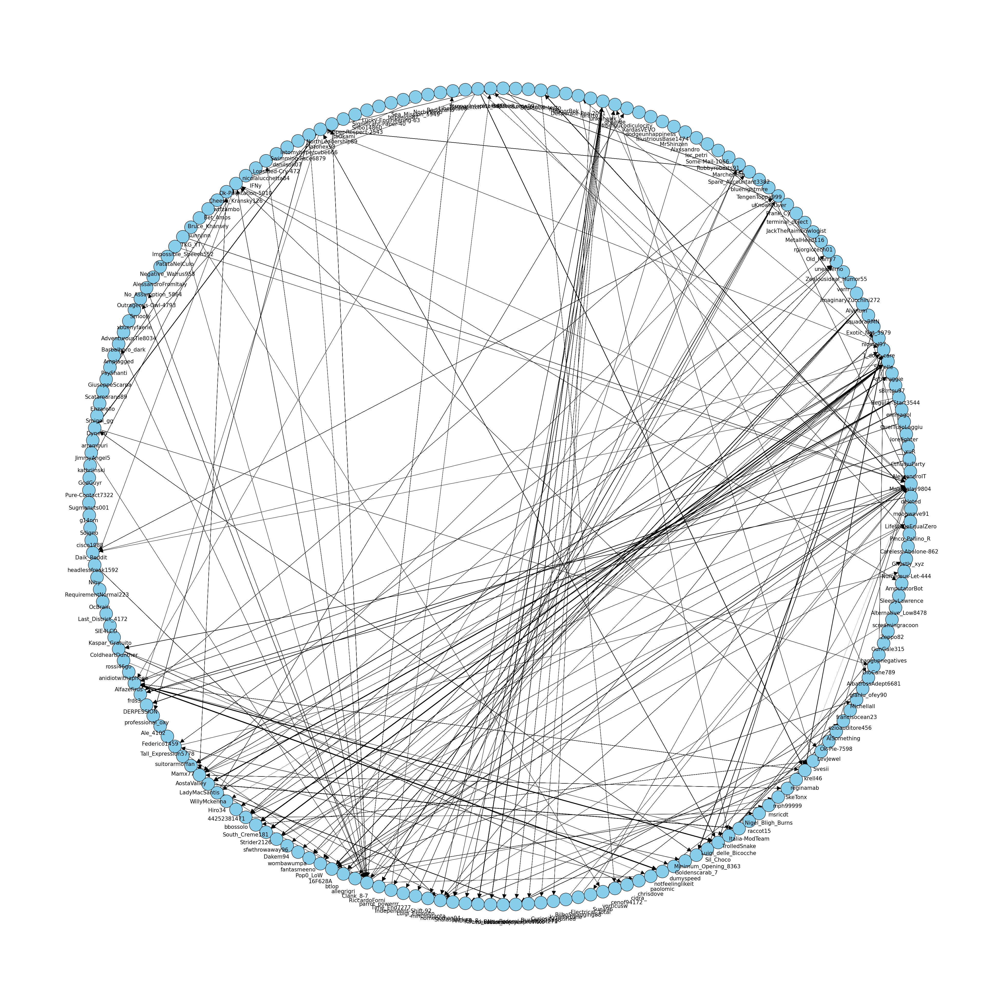

In [131]:
import matplotlib.pyplot as plt
import igraph as ig

# Funzione per visualizzare il grafo
def plot_graph(g):
    # Utilizza il layout circolare
    layout = g.layout_circle()

    # Scala il layout per aumentare la distanza tra i nodi
    raggio_cerchio = 600  # Imposta il raggio del cerchio (puoi regolare questo valore)
    layout = [[raggio_cerchio * x, raggio_cerchio * y] for x, y in layout]

    # Crea una figura e un asse con dimensioni aumentate (24x24 pollici)
    fig, ax = plt.subplots(figsize=(50, 50))

    # Configurazione dello stile di visualizzazione
    visual_style = {
        "layout": layout,  # Utilizza il layout circolare scalato
        "vertex_label": g.vs["name"],  # Etichette dei nodi basate sul nome dei vertici
        "vertex_size": 50,  # Aumenta la dimensione dei nodi a 50
        "vertex_color": "skyblue",  # Colore dei nodi azzurro
        "vertex_label_size": 15,  # Aumenta la dimensione delle etichette dei nodi a 15
        "edge_color": "black",  # Colore degli archi nero
        "edge_width": [0.5 + 2 * weight / max(g.es['weight']) for weight in g.es['weight']],  # Spessore degli archi basato sul peso
        "margin": 50,  # Imposta un margine di 50
        "vertex_label_dist": 2,  # Imposta la distanza delle etichette dei nodi a 2
        "bbox": (1200, 1200),  # Dimensione dell'area di disegno (1200x1200 pixel)
        "target": ax,  # Specifica l'asse come destinazione per il disegno del grafo
        "edge_curved": 0,  # Imposta la curvatura degli archi a 0 per renderli dritti
    }

    # Disegna il grafo con lo stile di visualizzazione specificato
    ig.plot(g, **visual_style)
    # Mostra la figura
    plt.show()

# Visualizza il grafo
plot_graph(g)


In [118]:
# Verifica degli archi
print(f"Number of edges: {g.ecount()}")
print("Edges:")
for edge in g.es[:10]:  # Itera sui primi 10 archi
    print(edge.tuple)

Number of edges: 358
Edges:
(0, 48)
(0, 115)
(3, 119)
(4, 120)
(6, 118)
(7, 126)
(7, 127)
(8, 128)
(8, 129)
(8, 1)


In [119]:
g.vs.attribute_names()

['name']

### Calcolo della centralità

Per colorare i nodi del grafo in base alla partecipazione e alla centralità nelle diverse discussioni, si segue una strategia che prevede:
1. Identificazione delle componenti connesse: ogni componente connessa nel grafo rappresenta una discussione separata. I nodi all'interno della stessa componente connessa hanno un colore basato sulla loro centralità all'interno di quella componente.
2. Calcolo della centralità dei nodi: si utilizza la centralità per determinare quale nodo è più centrale e quale è meno centrale all'interno di ciascuna discussione. I nodi con un grado più alto saranno colorati con un colore più scuro, mentre quelli con un grado più basso saranno colorati con un colore più chiaro.

In [120]:
degree_in = g.degree(g.vs, mode="in")
#degree centrality per tutta la vertex sequence

#mode = all per undirected graphs
#mode = in per in-degree centrality (directed graphs)
#mode = out per out-degree centrality (directed graphs)

degree_in.sort(reverse=True)

In [121]:
degree_in

[52,
 17,
 16,
 13,
 9,
 8,
 8,
 7,
 7,
 6,
 6,
 6,
 6,
 6,
 6,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0]

In [122]:
degree_out = g.degree(g.vs, mode="out")

degree_out.sort(reverse=True)

In [123]:
degree_out

[18,
 17,
 14,
 13,
 12,
 11,
 10,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 7,
 6,
 6,
 6,
 6,
 6,
 5,
 5,
 5,
 5,
 4,
 4,
 4,
 4,
 4,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 3,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0]

C:\Users\franc\AppData\Local\Temp\ipykernel_18928\4152669076.py:9: DeprecationWarning: Graph.clusters() is deprecated; use Graph.connected_components() instead
  components = g.clusters(mode="WEAK")
C:\Users\franc\AppData\Local\Temp\ipykernel_18928\4152669076.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  component_colors = [plt.cm.get_cmap("hsv")(i/num_components) for i in range(num_components)]


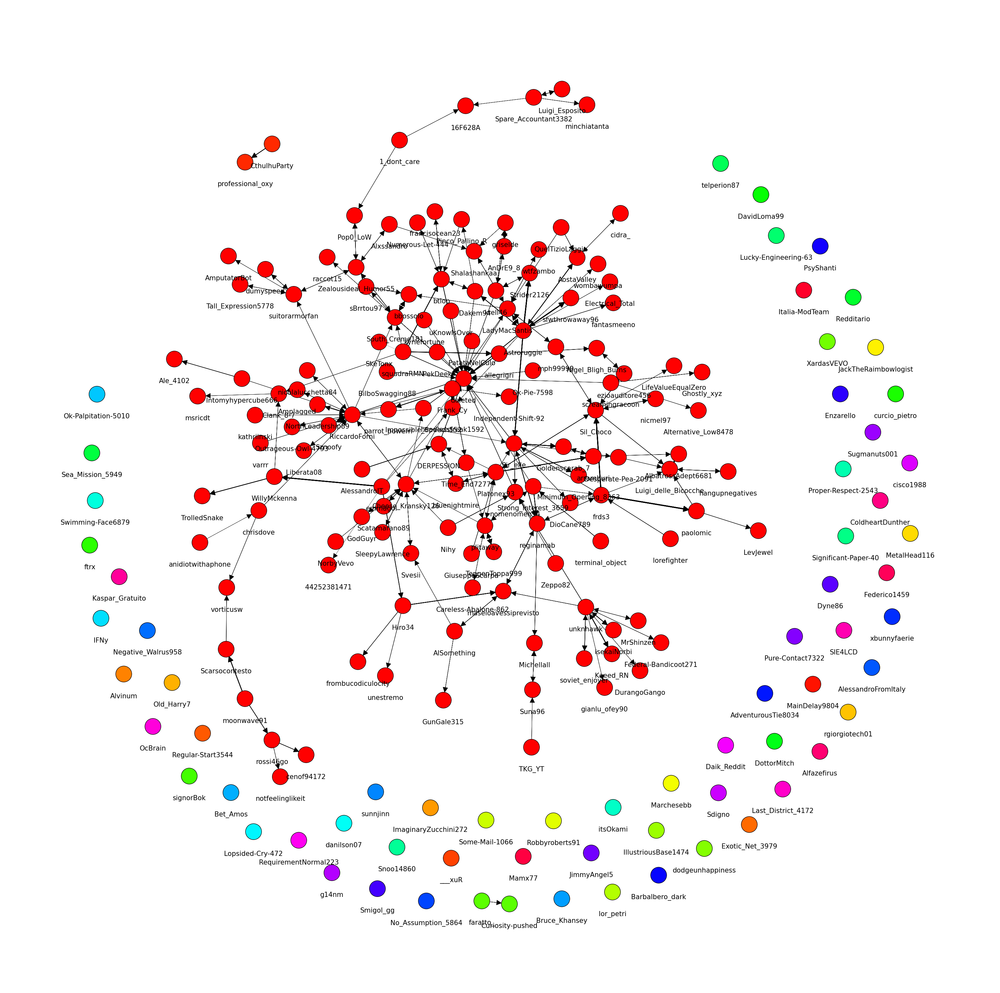

In [133]:
import matplotlib.pyplot as plt
import igraph as ig
import numpy as np
import random

# Funzione per visualizzare il grafo con colorazione dei nodi basata su discussioni separate
def plot_graph_with_color(g):
    # Calcola le componenti connesse del grafo
    components = g.clusters(mode="WEAK")

    # Genera una lista di colori casuali per ogni componente connessa
    num_components = len(components)
    component_colors = [plt.cm.get_cmap("hsv")(i/num_components) for i in range(num_components)]

    # Colori per i nodi
    node_colors = np.zeros((len(g.vs), 3))  # Inizializza array di colori RGB

    # Assegna un colore a ciascun nodo basato sulla componente connessa di appartenenza
    for comp_id, component in enumerate(components):
        color_rgb = np.array(component_colors[comp_id][:3])  # Estrai RGB dalla tupla di colore
        for node_idx in component:
            node_colors[node_idx] = color_rgb  # Assegna colore RGB al nodo

    # Utilizza il layout Fruchterman-Reingold per posizionare i nodi
    layout = g.layout_fruchterman_reingold()

    # Crea una figura e un asse con dimensioni personalizzate
    fig, ax = plt.subplots(figsize=(40, 40))

    # Configurazione dello stile di visualizzazione
    visual_style = {
        "layout": layout,  # Layout dei nodi
        "vertex_label": g.vs["name"],  # Etichette dei nodi basate sul nome
        "vertex_size": 50,  # Dimensione dei nodi
        "vertex_color": [tuple(color) for color in node_colors],  # Colori basati sulla componente connessa
        "vertex_label_size": 15,  # Dimensione delle etichette dei nodi
        "edge_color": "black",  # Colore degli archi
        "edge_width": [0.5 + 2 * weight / max(g.es['weight']) for weight in g.es['weight']],  # Spessore degli archi basato sul peso
        "margin": 50,  # Margine
        "vertex_label_dist": 2,  # Distanza delle etichette dei nodi
        "bbox": (1000, 1000),  # Dimensione dell'area di disegno
        "target": ax,  # Asse come destinazione per il disegno del grafo
        "edge_curved": 0,  # Archi dritti
    }

    # Disegna il grafo con lo stile di visualizzazione specificato
    ig.plot(g, **visual_style)
    # Mostra la figura
    plt.show()

# Esempio di utilizzo della funzione
plot_graph_with_color(g)



C:\Users\franc\AppData\Local\Temp\ipykernel_18928\370622746.py:5: DeprecationWarning: Graph.clusters() is deprecated; use Graph.connected_components() instead
  components = g.clusters(mode="WEAK")


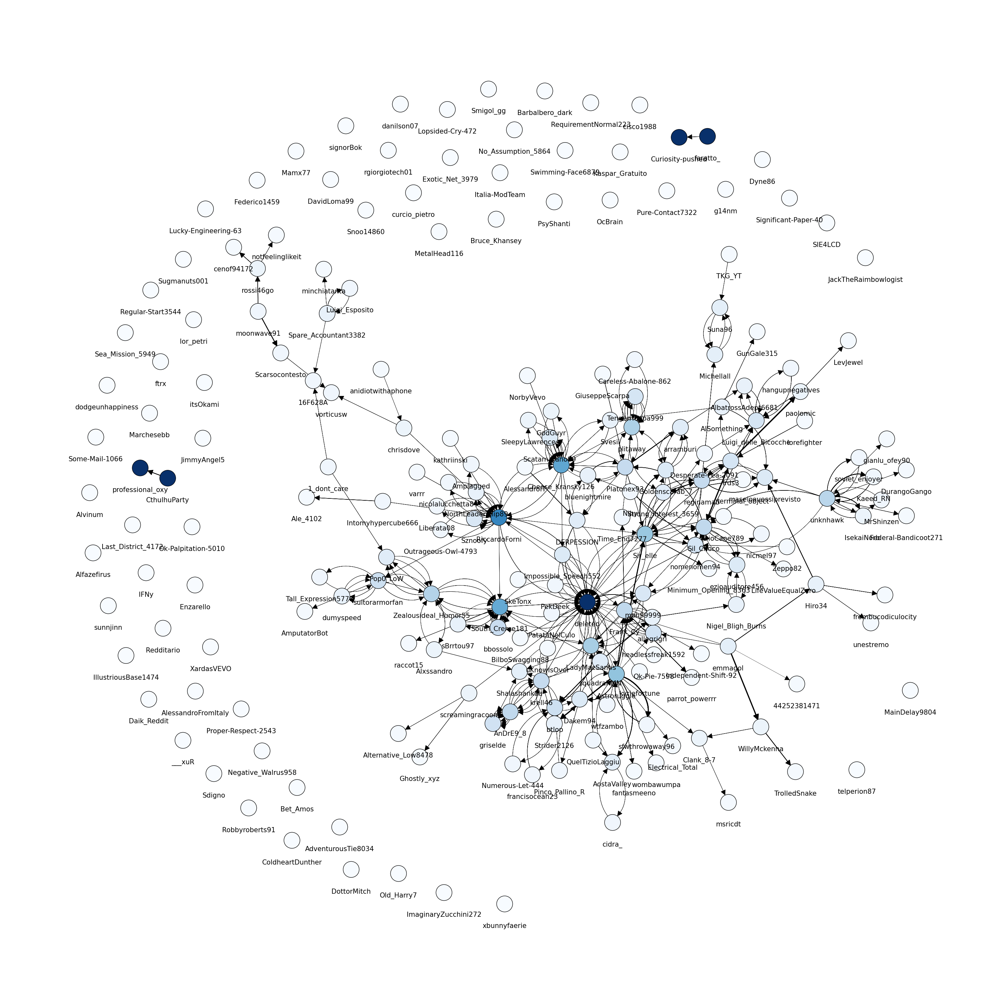

In [134]:
# Funzione per visualizzare il grafo con colorazione dei nodi basata sulla partecipazione e centralità
def plot_graph_with_color(g):
    
    # Calcola le componenti connesse del grafo
    components = g.clusters(mode="WEAK")

    # Colori graduali per rappresentare la centralità dei nodi all'interno delle componenti connesse
    cmap = plt.get_cmap("Blues")  # Colore dal rosso chiaro al rosso scuro
    node_colors = np.zeros(len(g.vs))  # Inizializza array di colori

    # Assegna un colore graduale a ciascun nodo basato sulla sua centralità all'interno della componente connessa
    for comp_id, component in enumerate(components):
        # Calcola la centralità dei nodi all'interno della componente connessa
        node_degrees = np.array(g.degree(component))  # Grado dei nodi nella componente
        max_degree = node_degrees.max()

        if max_degree > 0:
            # Normalizza il grado dei nodi per ottenere valori tra 0 e 1
            normalized_degrees = node_degrees / max_degree
            # Applica la scala di colori graduale basata sulla centralità
            for i, node_idx in enumerate(component):
                node_colors[node_idx] = normalized_degrees[i]

    # Utilizza il layout Fruchterman-Reingold per posizionare i nodi
    layout = g.layout_fruchterman_reingold()

    # Crea una figura e un asse con dimensioni personalizzate
    fig, ax = plt.subplots(figsize=(40, 40))

    # Configurazione dello stile di visualizzazione
    visual_style = {
        "layout": layout,  # Utilizza il layout Kamada-Kawai
        "vertex_label": g.vs["name"],  # Etichette dei nodi basate sul nome dei vertici
        "vertex_size": 50,  # Aumenta la dimensione dei nodi a 50
        "vertex_color": [cmap(color) for color in node_colors],  # Colori graduati basati sulla centralità
        "vertex_label_size": 15,  # Aumenta la dimensione delle etichette dei nodi a 15
        "edge_color": "black",  # Colore degli archi nero
        "edge_width": [0.5 + 2 * weight / max(g.es['weight']) for weight in g.es['weight']],  # Spessore degli archi basato sul peso
        "margin": 50,  # Imposta un margine di 100
        "vertex_label_dist": 2,  # Imposta la distanza delle etichette dei nodi a 2
        "bbox": (1200, 1200),  # Dimensione dell'area di disegno (1200x1200 pixel)
        "target": ax,  # Specifica l'asse come destinazione per il disegno del grafo
    }

    # Disegna il grafo con lo stile di visualizzazione specificato
    ig.plot(g, **visual_style)
    # Mostra la figura
    plt.show()

# Esempio di utilizzo della funzione
plot_graph_with_color(g)


C:\Users\franc\AppData\Local\Temp\ipykernel_18928\2364920367.py:5: DeprecationWarning: Graph.clusters() is deprecated; use Graph.connected_components() instead
  components = g.clusters(mode="WEAK")


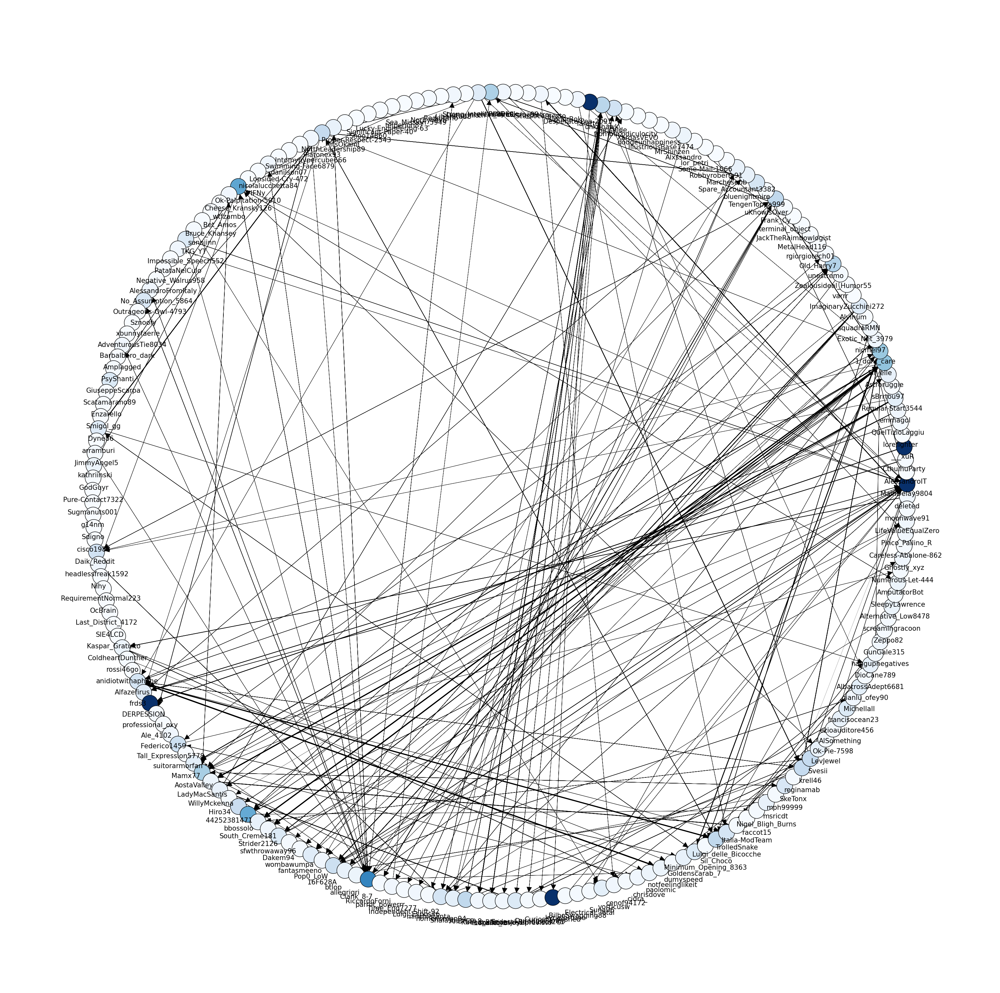

In [135]:
# Funzione per visualizzare il grafo con colorazione dei nodi basata sulla partecipazione e centralità
def plot_graph_with_color(g):
    
    # Calcola le componenti connesse del grafo
    components = g.clusters(mode="WEAK")

    # Colori graduali per rappresentare la centralità dei nodi all'interno delle componenti connesse
    cmap = plt.get_cmap("Blues")  # Colore dal rosso chiaro al rosso scuro
    node_colors = np.zeros(len(g.vs))  # Inizializza array di colori

    # Assegna un colore graduale a ciascun nodo basato sulla sua centralità all'interno della componente connessa
    for comp_id, component in enumerate(components):
        # Calcola la centralità dei nodi all'interno della componente connessa
        node_degrees = np.array(g.degree(component))  # Grado dei nodi nella componente
        max_degree = node_degrees.max()

        if max_degree > 0:
            # Normalizza il grado dei nodi per ottenere valori tra 0 e 1
            normalized_degrees = node_degrees / max_degree
            # Applica la scala di colori graduale basata sulla centralità
            for i, node_idx in enumerate(component):
                node_colors[node_idx] = normalized_degrees[i]

    # Utilizza il layout Fruchterman-Reingold per posizionare i nodi
    layout = g.layout_circle()

    # Crea una figura e un asse con dimensioni personalizzate
    fig, ax = plt.subplots(figsize=(40, 40))

    # Configurazione dello stile di visualizzazione
    visual_style = {
        "layout": layout,  # Utilizza il layout Kamada-Kawai
        "vertex_label": g.vs["name"],  # Etichette dei nodi basate sul nome dei vertici
        "vertex_size": 50,  # Aumenta la dimensione dei nodi a 50
        "vertex_color": [cmap(color) for color in node_colors],  # Colori graduati basati sulla centralità
        "vertex_label_size": 15,  # Aumenta la dimensione delle etichette dei nodi a 15
        "edge_color": "black",  # Colore degli archi nero
        "edge_width": [0.5 + 2 * weight / max(g.es['weight']) for weight in g.es['weight']],  # Spessore degli archi basato sul peso
        "margin": 50,  # Imposta un margine di 100
        "vertex_label_dist": 2,  # Imposta la distanza delle etichette dei nodi a 2
        "bbox": (1200, 1200),  # Dimensione dell'area di disegno (1200x1200 pixel)
        "target": ax,  # Specifica l'asse come destinazione per il disegno del grafo
        "edge_curved": 0,  # Imposta la curvatura degli archi a 0 per renderli dritti
    }

    # Disegna il grafo con lo stile di visualizzazione specificato
    ig.plot(g, **visual_style)
    # Mostra la figura
    plt.show()

# Esempio di utilizzo della funzione
plot_graph_with_color(g)

## Analisi sul secondo post

https://quifinanza.it/economia/giovani-italiani-estero-dati-2024/823439/   